### Load all libraries

In [1]:
import dask.distributed
import dask.utils
import numpy as np
import planetary_computer as pc
import xarray as xr
from IPython.display import display
from pystac_client import Client
import matplotlib.pyplot as plt
%matplotlib inline
from odc.stac import configure_rio, stac_load
import rasterio
from skimage.segmentation import felzenszwalb
from skimage.segmentation import mark_boundaries
from pathlib import Path
import scipy
import scipy.ndimage
import os
import pyproj
from pyproj import CRS, Proj

In [2]:
# Configuration of bands. * used as wildcard
cfg = {
    "sentinel-2-l2a": {
        "assets": {
            "*": {"data_type": "uint16", "nodata": 0},
            "SCL": {"data_type": "uint8", "nodata": 0},
            "visual": {"data_type": "uint8", "nodata": 0},
        },
    },
    "*": {"warnings": "ignore"},
}

### Start Dask Client: for improving load speed significantly (optional)

In [3]:
client = dask.distributed.Client()
configure_rio(cloud_defaults=True, client=client)
display(client)

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 4
Total threads: 16,Total memory: 63.42 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:58494,Workers: 4
Dashboard: http://127.0.0.1:8787/status,Total threads: 16
Started: Just now,Total memory: 63.42 GiB
Comm: tcp://127.0.0.1:58515,Total threads: 4
Dashboard: http://127.0.0.1:58520/status,Memory: 15.86 GiB
Nanny: tcp://127.0.0.1:58497,


## Sentinel-2 dataset

### Query STAC API

In [4]:
# Looking for Sentinel dataset
catalog = Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")

query = catalog.search(
    collections=["sentinel-2-l2a"],
    datetime="2021-08-01", #("2020-05", "2020-09"),
    query={"s2:mgrs_tile": dict(eq="36RUV")}, #36RVV
)

#"id":"S2B_MSIL2A_20200831T082609_R021_T36RUV_20200907T202317","bbox":[30.891505967555467,30.628070840187593,32.05868610559479,31.632004205184607]
#"id":"S2B_MSIL2A_20200831T082609_R021_T36RVV_20200907T202303","bbox":[31.945103014025513,30.64062679022522,33.10292414366411,31.635505628734723]
items = list(query.get_items())
print(f"Found: {len(items):d} datasets")

Found: 1 datasets


C:\Users\Mona'asus\AppData\Roaming\Python\Python311\site-packages\pystac_client\item_search.py:835: FutureWarning: get_items() is deprecated, use items() instead
  warnings.warn(


### Load the required bands

In [5]:
resolution = 10
SHRINK = 4
if client.cluster.workers[0].memory_limit < dask.utils.parse_bytes("4G"):
    SHRINK = 8  # running on Binder with 2Gb RAM

if SHRINK > 1:
    resolution = resolution * SHRINK

xx = stac_load(
    items,
    bands=["red", "green", "blue", "B05", "nir", "B11", "B12", "SCL"],
    #chunks={"x": 2048, "y": 2048},
    stac_cfg=cfg,
    patch_url=pc.sign,
    resolution=10, #resolution,
)

print(f"Bands: {','.join(list(xx.data_vars))}")
display(xx)

C:\ProgramData\anaconda3\Lib\site-packages\distributed\worker_memory.py:504: FutureWarning: The `Nanny.memory_limit` attribute has been moved to `Nanny.memory_manager.memory_limit
  warnings.warn(


Bands: red,green,blue,B05,nir,B11,B12,SCL


<xarray.Dataset>
Dimensions:      (y: 10980, x: 10980, time: 1)
Coordinates:
  * y            (y) float64 3.5e+06 3.5e+06 3.5e+06 ... 3.39e+06 3.39e+06
  * x            (x) float64 3e+05 3e+05 3e+05 ... 4.098e+05 4.098e+05 4.098e+05
    spatial_ref  int32 32636
  * time         (time) datetime64[ns] 2021-08-01T08:26:11.024000
Data variables:
    red          (time, y, x) uint16 551 534 526 520 521 ... 915 645 714 746
    green        (time, y, x) uint16 898 882 853 836 907 ... 1042 955 949 998
    blue         (time, y, x) uint16 885 893 890 909 896 ... 662 520 485 431 487
    B05          (time, y, x) uint16 535 535 518 518 523 ... 1814 1814 1673 1673
    nir          (time, y, x) uint16 362 335 360 324 363 ... 4632 5296 5192 5196
    B11          (time, y, x) uint16 188 188 173 173 177 ... 2955 2955 2790 2790
    B12          (time, y, x) uint16 144 144 131 131 133 ... 1829 1829 1584 1584
    SCL          (time, y, x) uint8 6 6 6 6 6 6 6 6 6 6 ... 4 4 4 4 4 4 4 4 4 4

#### Plot the bands

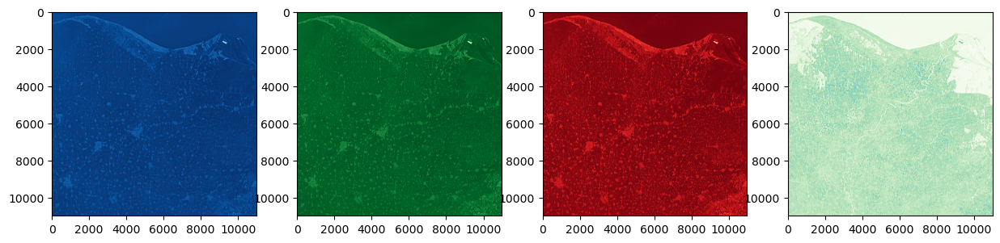

In [6]:
# checking the images
fig, ax = plt.subplots(1, 4, figsize=(15, 5))
ax[0].imshow(xx['blue'][0], cmap='Blues_r')
ax[1].imshow(xx['green'][0], cmap='Greens_r')
ax[2].imshow(xx['red'][0], cmap='Reds_r')
ax[3].imshow(xx['nir'][0], cmap='GnBu')

In [7]:
xx['red'][0].shape, xx['green'].shape, xx['blue'].shape

((10980, 10980), (1, 10980, 10980), (1, 10980, 10980))

In [8]:
type(xx['red'][0]), type(xx['green']), type(xx['blue'])

(xarray.core.dataarray.DataArray,
 xarray.core.dataarray.DataArray,
 xarray.core.dataarray.DataArray)

### make RGB composite

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


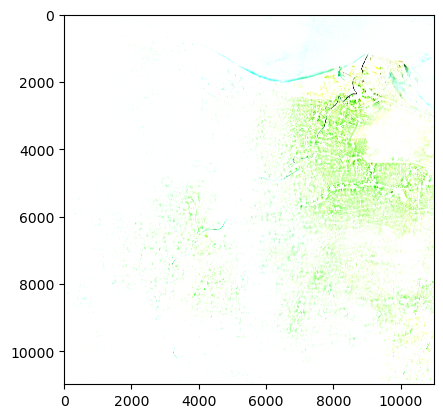

In [9]:
rgb_composite_raw= np.dstack((xx['red'][0], xx['green'][0], xx['blue'][0]))
plt.imshow(rgb_composite_raw, cmap = 'Spectral')

In [10]:
rgb_composite_raw.shape, type(rgb_composite_raw)

((10980, 10980, 3), numpy.ndarray)

In [11]:
blue_mean = np.mean(xx['blue'])
blue_mean

<xarray.DataArray 'blue' ()>
array(568.65368753)
Coordinates:
    spatial_ref  int32 32636

In [12]:
blue_mean = np.mean(xx['blue'][0])
blue_mean

<xarray.DataArray 'blue' ()>
array(568.65368753)
Coordinates:
    spatial_ref  int32 32636
    time         datetime64[ns] 2021-08-01T08:26:11.024000

### Calculating Vegetation indices

In [13]:
# Define a function for calculating the noramlized indices
def normalized_index(img, b1, b2, eps=0.0001):
    band1 = np.where((img[b1][0]==0) & (img[b2][0]==0), np.nan, img[b1][0])
    band2 = np.where((img[b1][0]==0) & (img[b2][0]==0), np.nan, img[b2][0])
    
    return (band1 - band2) / (band1 + band2)

#### NDVI index
Normalized difference vegetation index (NDVI) quantifies vegetation health using near-infrared (which is reflected by vegetation) and red light (which is absorbed by vegetation).

The sensitivity of the NDVI to soil background and atmospheric effects stimulates the development of new Vis, such as the soil-adjusted vegetation index (SAVI), optimized soil-adjusted vegetation index (OSAVI), and atmospherically resistant vegetation index (ARVI).

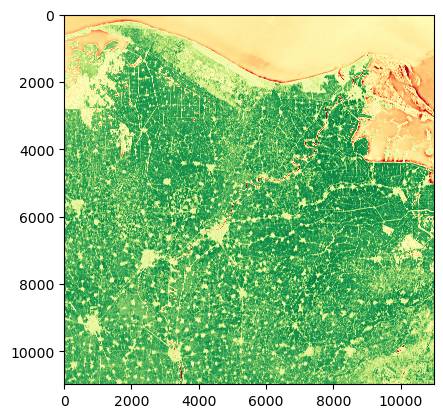

In [14]:
ndvi = normalized_index(xx, "nir", "red")
plt.imshow(ndvi, cmap = "RdYlGn")

#### NDBI index
Normalized Difference Built-up Index (NDBI) uses the NIR and SWIR bands to emphasize manufactured built-up areas.

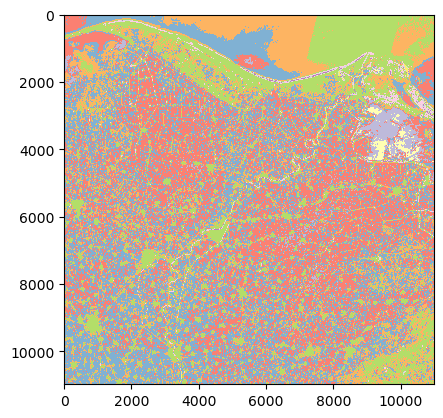

In [15]:
# Calculate NDBI without downscaling to SWIR
ndbi = normalized_index(xx, "B11", "nir")
plt.imshow(ndbi, cmap = "Set3")

#### DBSI
Dry Bare Soil Index (DBSI)  is a numerical indicator that combines blue, red, near infrared and short wave infrared spectral bands to capture soil variations. It is an inverse modified normalized difference index (MNDWI) adjusted by the normalized difference vegetation index (NDVI)

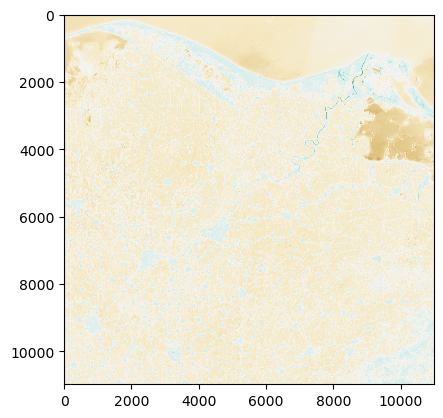

In [16]:
# DBSI = ((SWIR – GREEN) / (SWIR + GREEN) ) – NDVI
dbsi = normalized_index(xx, "B11", "green") - ndvi
plt.imshow(dbsi, cmap = "BrBG")

#### SAVI
Soil adjusted vegetation index (SAVI) is a vegetation index that attempts to minimize soil brightness influences using a soil-brightness correction factor. This is often used in arid regions where vegetative cover is low, and it outputs values between -1.0 and 1.0.

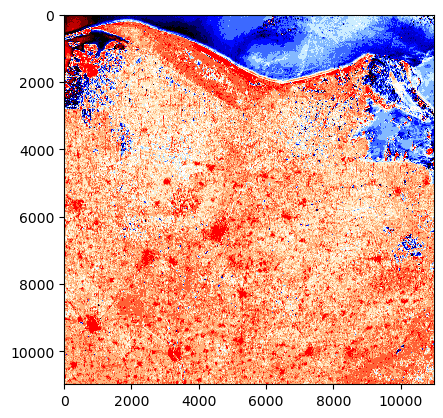

In [17]:
# SAVI= 1.5(NIR – R) (NIR+R+0.5)
savi = 1.5 * (xx['nir'][0] - xx['red'][0]) * (xx['nir'][0] + xx['red'][0] + 0.5)
plt.imshow(savi, cmap = "flag")

#### OSAVI
Optimized soil adjusted vegetation index (OSAVI) is a modified SAVI and also uses reflectance in the NIR and red spectrum. The difference between the two indices is that OSAVI takes into account the standard value of the canopy background adjustment factor (0.16).

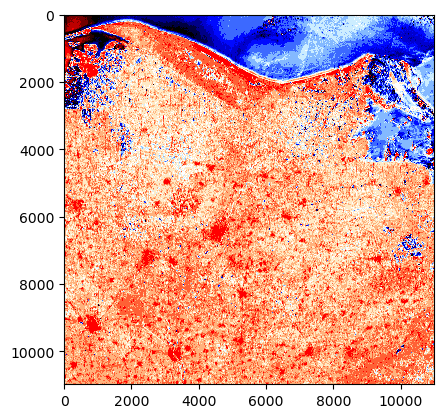

In [18]:
# OSAVI= 1.16(NIR – R)/ (NIR+R+0.16)
osavi = 1.16 * (xx['nir'][0] - xx['red'][0]) * (xx['nir'][0] + xx['red'][0] + 0.16)
plt.imshow(osavi, cmap = "flag")

#### NDWI
Normal Difference Water Index (NDWI) is used to highlight open water features in a satellite image, allowing a water body to “stand out” against the soil and vegetation. NDWI index effectively measures moisture content.

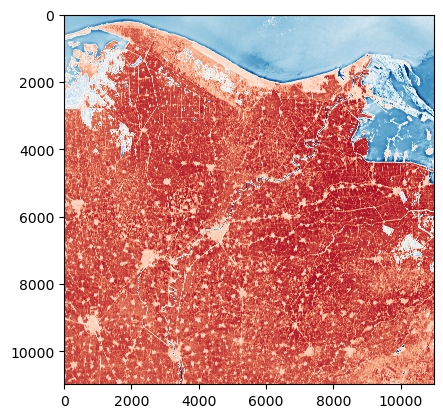

In [19]:
# NDWI = (GREEN - NIR) / (GREEN + NIR)
ndwi = normalized_index(xx, "green", "nir")
plt.imshow(ndwi, cmap = "RdBu")

#### NDMI
Difference Moisture Index (NDMI) is used to determine vegetation water content which helps in monitoring the drought condition of the areas

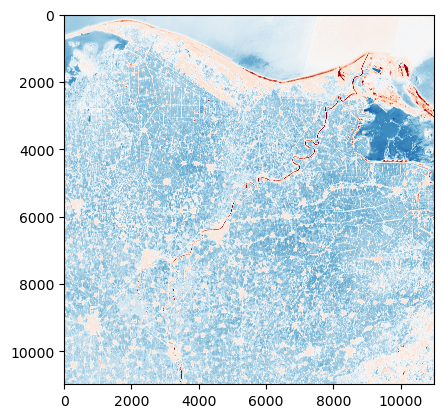

In [20]:
# NDMI = (NIR - SWIR) / (NIR + SWIR)
ndmi = normalized_index(xx, "nir", "B11")
plt.imshow(ndmi, cmap = "RdBu")

#### MNDWI
Modified Normalized Difference Water Index (MNDWI) effectively differentiates between water and urban areas in satellite images. 
The MNDWI values were positive for water features (cropped area inundated with water) even vegetation was mixed with water because NIR band is not used for calculation of MNDWI. These results suggest that MNDWI is more sensitive to water features mixed with vegetation than NDWI due to positive values of MNDWI.

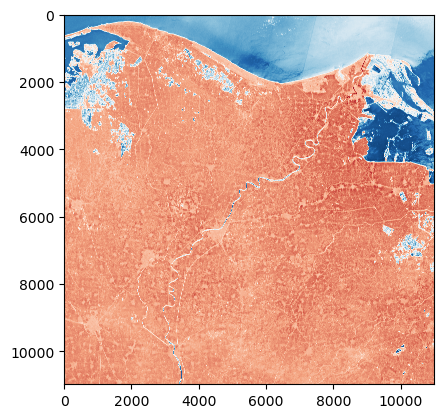

In [21]:
# MNDWI = (GREEN − SWIR1)/(GREEN + SWIR1)
mndmi = normalized_index(xx, "green", "B11")
plt.imshow(mndmi, cmap = "RdBu")

#### WRI
Water Ratio Index (WRI) can be used to determine the amount of moisture in the vegetation cover.

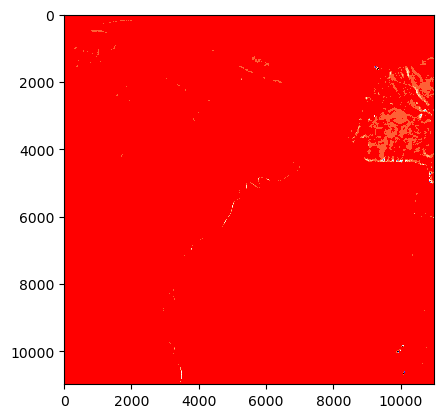

In [22]:
# WRI = (GREEN + RED)/(NIR + SWIR1)
wri = (xx['green'][0] + xx['red'][0]) / (xx['nir'][0] + xx['B11'][0])
plt.imshow(wri, cmap = "flag")

#### AWEI
Automated Water Extraction Index (AWEI) aims to enhance land cover classification accuracy into binary water and non-water under various environmental conditions.

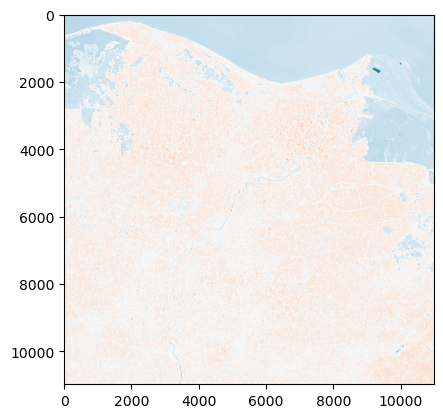

In [23]:
# AWEIsh = BLUE + 2.5 × GREEN − 1.5 × (NIR + SWIR1) − 0.25 × SWIR2
awei = xx['blue'][0] + 2.5 * xx['green'][0] - 1.5 * (xx['nir'][0] + xx['B11'][0]) - 0.25 * xx['B12'][0]
plt.imshow(awei, cmap = "RdBu")

#### STR
 Shortwave infrared transformed reflectance (STR) for bare soils for two SWIR bands (B11 and B12).

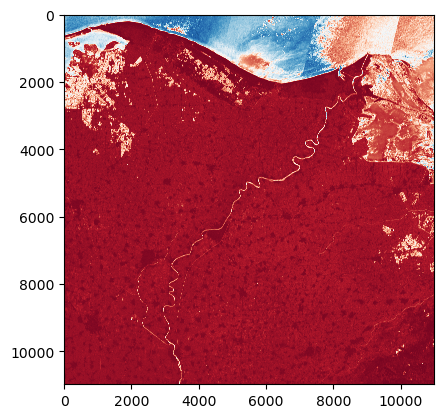

In [24]:
# STR = (1 - SWIR)2 / 2 SWIR
# First for SWIR 1
str_11 = ((1 - xx['B11'][0])**2) / (2 * xx['B11'][0])
plt.imshow(str_11, cmap = "RdBu")

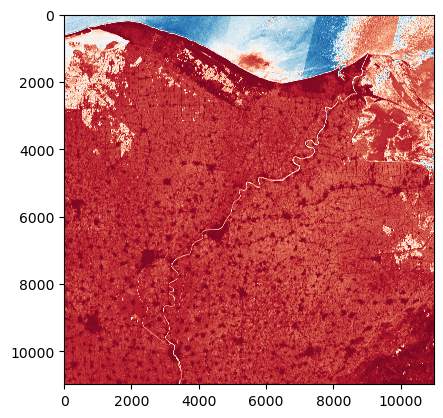

In [25]:
# STR = (1 - SWIR)2 / 2 SWIR
# Second for SWIR 2
str_12 = ((1 - xx['B12'][0])**2) / (2 * xx['B12'][0])
plt.imshow(str_12, cmap = "RdBu")

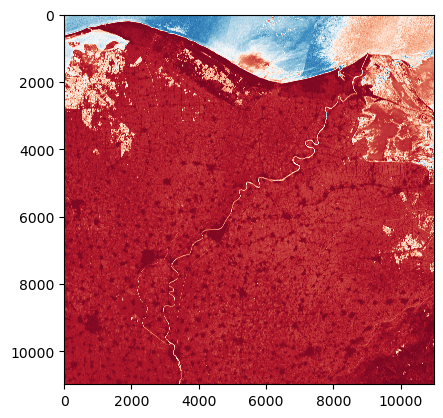

In [26]:
# Get the average of SWIR 1 and 2
str_avg = (str_11 + str_12) / 2
plt.imshow(str_avg, cmap = "RdBu")

#### RVI
Ratio vegetation index (RVI)  has the potential to indicate the stress level of crops, due to its high correlation with the leaf area, dry biomass and chlorophyll content

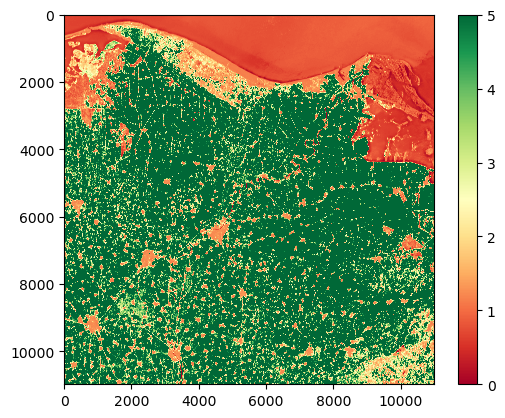

In [27]:
# RVI=NIR/R
rvi1 = xx['nir'][0] / xx['red'][0]
plt.imshow(rvi1, cmap = 'RdYlGn', vmin=0, vmax=5)
plt.colorbar()

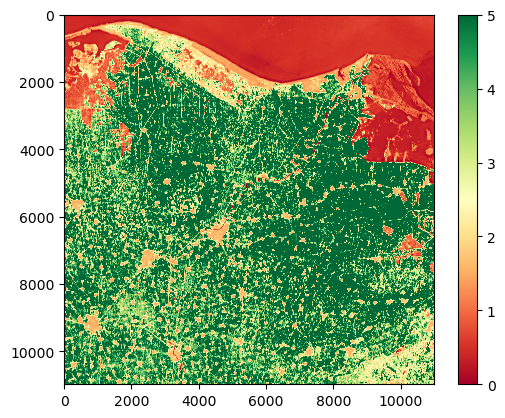

In [28]:
# Ratio vegetation index 2 (RVI2)
# RVI2=NIR/G
rvi2 = xx['nir'][0] / xx['green'][0]
plt.imshow(rvi2, cmap = 'RdYlGn', vmin=0, vmax=5)
plt.colorbar()

#### TVI
Triangular vegetation index (TVI) is calculated as the area of a hypothetical triangle in spectral space that connects (1) green peak reflectance, (2) minimum chlorophyll absorption, and (3) the NIR shoulder. TVI has higher coefficient of determination for the same variable with positive values and the variances of the ratio are proportional to mean values.

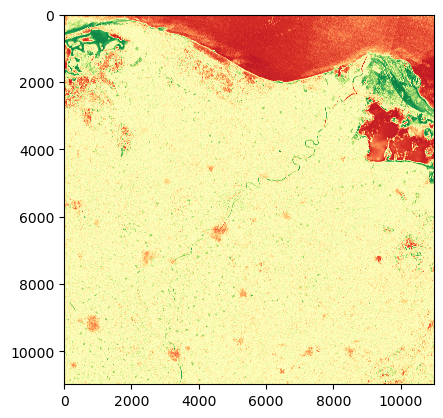

In [29]:
# TVI= 60(NIR – G) – 100(R – G)
tvi = 60 * (xx['nir'][0] - xx['green'][0]) - 100 * (xx['red'][0] - xx['green'][0])
plt.imshow(tvi, cmap = 'RdYlGn')

#### EVI
Enhanced vegetation index (EVI) is similar to Normalized Difference Vegetation Index (NDVI) and can be used to quantify vegetation greenness. However, EVI corrects for some atmospheric conditions and canopy background noise and is more sensitive in areas with dense vegetation.

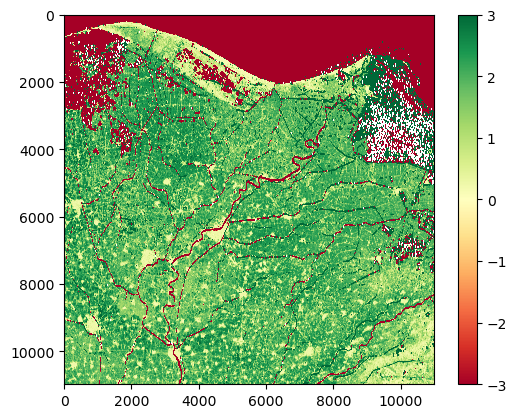

In [30]:
# EVI = G * ((NIR - R) / (NIR + C1 * R – C2 * B + L))
# EVI = 2.5 * ((NIR – R) / (NIR + 6 * R – 7.5 * B + 1))
evi = 2.5 * ((xx['nir'][0] - xx['red'][0]) / (xx['nir'][0] + 6 * xx['red'][0] - 7.5 * xx['blue'][0] + 1))
plt.imshow(evi, cmap = 'RdYlGn', vmin=-3, vmax=3)
plt.colorbar()

#### GI
Green Index (GI) is used to estimate the content of leaf chlorophyll in various species of plants.

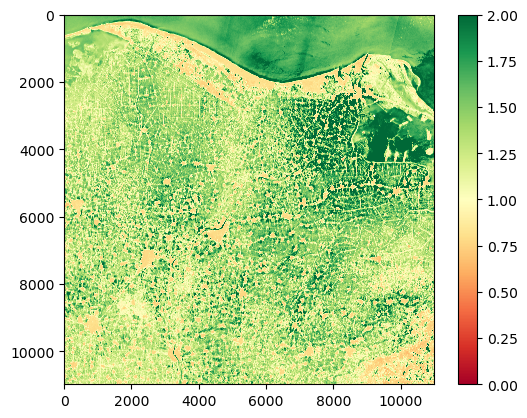

In [31]:
# GI=G/R
gi = xx['green'][0] / xx['red'][0]
plt.imshow(gi, cmap = 'RdYlGn', vmin=0, vmax=2)
plt.colorbar()

#### CGI
Green Chlorophyll Vegetation Index (GCI) 

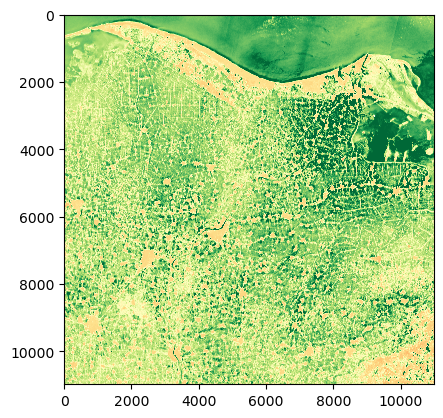

In [32]:
# GCI = NIR / GREEN – 1
gi = xx['green'][0] / xx['red'][0] -1
plt.imshow(gi, cmap = 'RdYlGn', vmin=-1, vmax=1)

#### GNDVI
Green normalized difference vegetation index (GNDVI)  is a vegetation index for estimating photo synthetic activity and is a commonly used vegetation index to determine water and nitrogen uptake into the plant canopy. GNDVI is more sensitive to chlorophyll variation in the crop than NDVI and has a higher saturation point. 

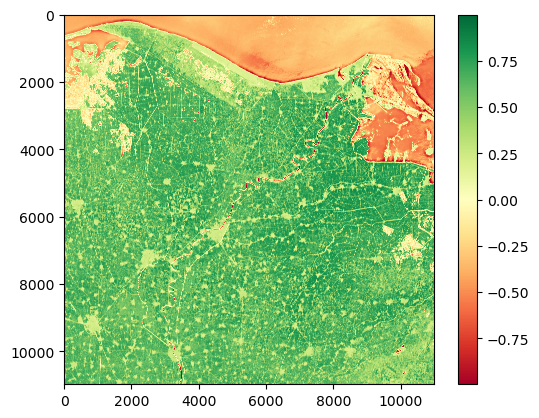

In [33]:
# GNDVI= (NIR – G)/ (NIR+G)
gndvi = normalized_index(xx, "nir", "green")
plt.imshow(gndvi, cmap = "RdYlGn")
plt.colorbar()

The estimation of the ratio of carotenoid concentration to chlorophyll one (Car/Chl) can be important for the diagnosis of stress changes in plants. It is known that the degradation of chlorophylls under the action of stressors or at senescence is faster than the degradation of carotenoids. These indices are:

#### SRPI
Simple ratio pigment index (SRPI) defined as the ratio between blue and red reflectance

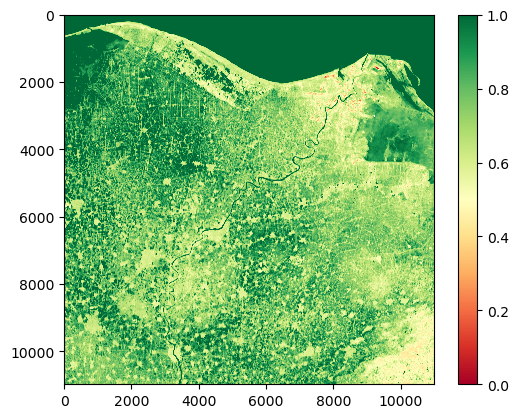

In [34]:
# SRPI=B/R
srpi = xx['blue'][0] / xx['red'][0]
plt.imshow(srpi, cmap = 'RdYlGn', vmin=0, vmax=1)
plt.colorbar()

#### NDPI
Normalized Difference Pond Index (NDPI) used in conjunction with NDVI, provides better discrimination of the aquatic and wetland vegetation from the
normal vegetation compared to the NDVI, which detects all types of vegetation. 

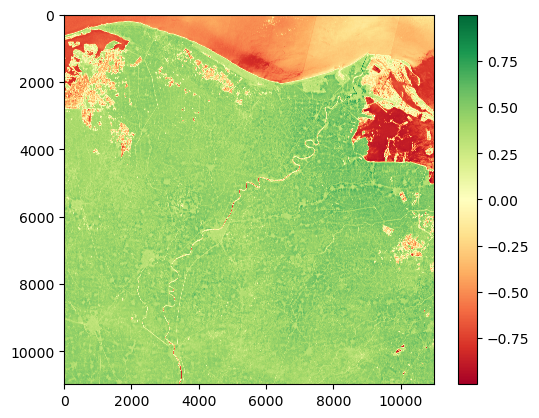

In [35]:
# NDPI = (SWIR1‐ Green)/(SWIR1+Green)
ndpi = normalized_index(xx, "B11", "green")
plt.imshow(ndpi, cmap = "RdYlGn")
plt.colorbar()

#### SIPI
Structure insensitive pigment index (SIPI). Increases in SIPI are thought to indicate increased canopy stress (carotenoid pigment).

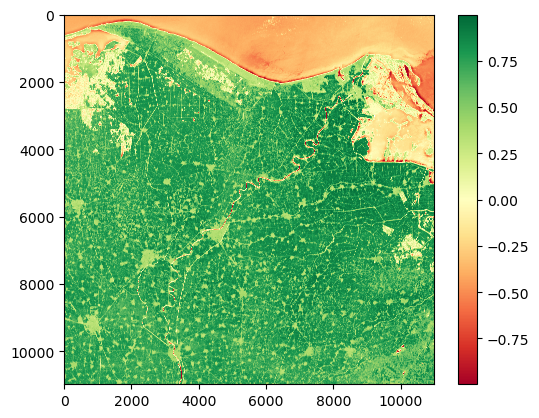

In [36]:
# SIPI= (NIR – B)/(NIR+B)
sipi = normalized_index(xx, "nir", "blue")
plt.imshow(sipi, cmap = "RdYlGn")
plt.colorbar()

#### NPCI
Normalized pigment chlorophyll index (NPCI). Varied with total pigments/chl

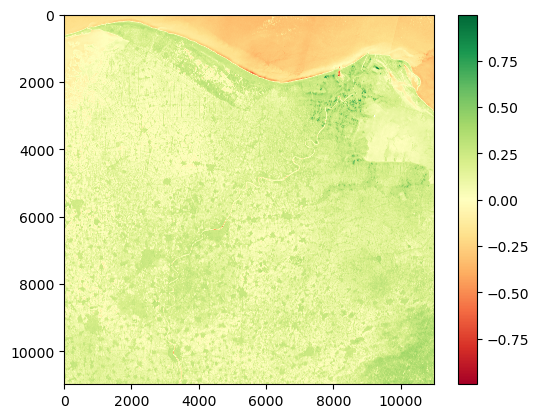

In [37]:
# NPCI= (R – B)/(R+B)
npci = normalized_index(xx, "red", "blue")
plt.imshow(npci, cmap = "RdYlGn")
plt.colorbar()

#### NDCI
Normalized Difference Chlorophyll Index (NDCI) was originally proposed for use to predict chlorophyll-a concentration using satellite remote sensing data in estuarine and coastal turbid productive waters and has since been applied for inland freshwater lake assessments.

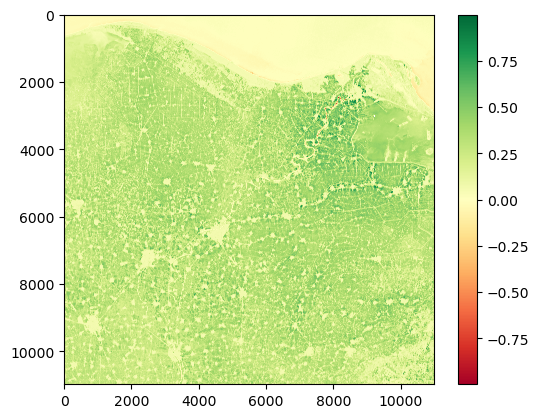

In [38]:
# NDCI = (B5 – B4) / (B5 + B4)
ndci = normalized_index(xx, "B05", "red")
plt.imshow(ndci, cmap = "RdYlGn")
plt.colorbar()

#### PSRI
Plant senescence reflectance index (PSRI). An increase in PSRI indicates increased canopy stress (carotenoid pigment), the onset of canopy senescence, and plant fruit ripening.

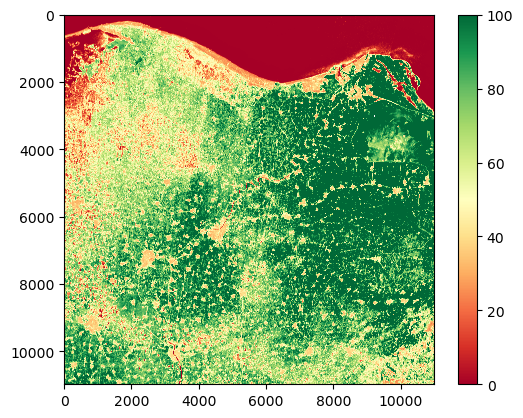

In [39]:
# PSRI= (B – R)/G
psri = (xx['blue'][0] - xx['red'][0]) / xx['green'][0]
plt.imshow(psri, cmap = "RdYlGn", vmin=0, vmax=100)
plt.colorbar()

#### NDVIgb
Normalized difference vegetation index 2 (NDVIgb)

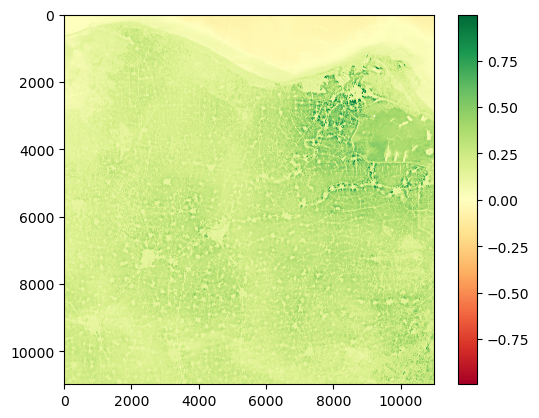

In [40]:
# NDVIgb= (G – B)/(G+B)
ndvi_gb = normalized_index(xx, "green", "blue")
plt.imshow(ndvi_gb, cmap = "RdYlGn")
plt.colorbar()

#### VARI
Visible Atmospheric Resistant Index (VARI) is a vegetation index for estimating vegetation fraction quantitatively with only the visible range of the spectrum.

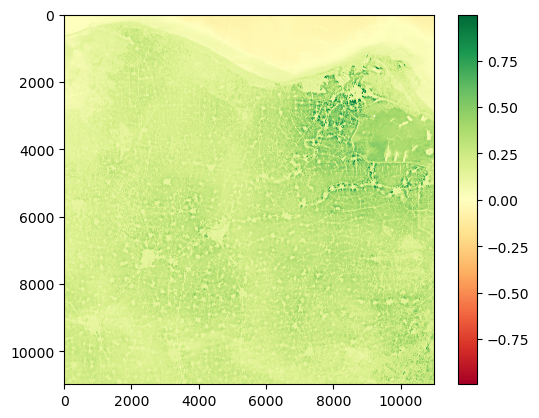

In [41]:
# VARI= (G – R)/(G+R – B)
vari = (xx['green'][0] - xx['red'][0]) / (xx['green'][0] + xx['red'][0] - xx['blue'][0])
plt.imshow(ndvi_gb, cmap = "RdYlGn")
plt.colorbar()

### Save the calculated vegetative indices as geotiff file.

In [42]:
# Get the height and width of veg. index
ndvi.shape[0], ndvi.shape[1]

(10980, 10980)

In [43]:
resdict = query.get_all_items_as_dict()
resdict

C:\Users\Mona'asus\AppData\Roaming\Python\Python311\site-packages\pystac_client\item_search.py:865: FutureWarning: get_all_items_as_dict() is deprecated, use item_collection_as_dict() instead.
  warnings.warn(


{'type': 'FeatureCollection',
 'features': [{'id': 'S2A_MSIL2A_20210801T082611_R021_T36RUV_20210801T231938',
   'bbox': [30.891505967555467,
    30.628070840187593,
    32.05868610559479,
    31.632004205184607],
   'type': 'Feature',
   'links': [{'rel': 'collection',
     'type': 'application/json',
     'href': 'https://planetarycomputer.microsoft.com/api/stac/v1/collections/sentinel-2-l2a'},
    {'rel': 'parent',
     'type': 'application/json',
     'href': 'https://planetarycomputer.microsoft.com/api/stac/v1/collections/sentinel-2-l2a'},
    {'rel': 'root',
     'type': 'application/json',
     'href': 'https://planetarycomputer.microsoft.com/api/stac/v1/'},
    {'rel': 'self',
     'type': 'application/geo+json',
     'href': 'https://planetarycomputer.microsoft.com/api/stac/v1/collections/sentinel-2-l2a/items/S2A_MSIL2A_20210801T082611_R021_T36RUV_20210801T231938'},
    {'rel': 'license',
     'href': 'https://sentinel.esa.int/documents/247904/690755/Sentinel_Data_Legal_Notice'

In [44]:
src = resdict['features'][0]['assets']['B04']['href']
src

'https://sentinel2l2a01.blob.core.windows.net/sentinel2-l2/36/R/UV/2021/08/01/S2A_MSIL2A_20210801T082611_N0300_R021_T36RUV_20210801T231938.SAFE/GRANULE/L2A_T36RUV_A031907_20210801T083224/IMG_DATA/R10m/T36RUV_20210801T082611_B04_10m.tif'

In [45]:
trans = resdict['features'][0]['assets']['B04']['proj:transform']
trans

[10.0, 0.0, 300000.0, 0.0, -10.0, 3500040.0]

In [46]:
dt = resdict['features'][0]['properties']['datetime'][0:10]
dt

'2021-08-01'

In [47]:
src = CRS.from_epsg(32636)
src
#src.to_wkt

<Projected CRS: EPSG:32636>
Name: WGS 84 / UTM zone 36N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 30°E and 36°E, northern hemisphere between equator and 84°N, onshore and offshore. Belarus. Cyprus. Egypt. Ethiopia. Finland. Israel. Jordan. Kenya. Lebanon. Moldova. Norway. Russian Federation. Saudi Arabia. Sudan. Syria. Türkiye (Turkey). Uganda. Ukraine.
- bounds: (30.0, 0.0, 36.0, 84.0)
Coordinate Operation:
- name: UTM zone 36N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [48]:
# Save NDVI calculated index as geotiff
img_path = os.path.join('sentinel2', 'ndvi_'+ dt +'.tif')
ndvi_tif = rasterio.open(img_path, 'w', driver='GTiff',
                            height = ndvi.shape[0], width = ndvi.shape[1],
                            count=1, dtype=str(ndvi.dtype),
                            crs=src, #'EPSG:32636',
                            transform=trans)

ndvi_tif.write(ndvi, 1)
ndvi_tif.close()

In [49]:
ndvi_href = "sentinel2/ndvi_" + dt + ".tif"
with rasterio.open(ndvi_href) as dataset:
    ndvi_bbox = list(dataset.bounds)
    ndvi_transform = list(dataset.transform)
    ndvi_shape = [dataset.height, dataset.width]
    bounds = dataset.bounds
    crs = dataset.crs

print('ndvi_bbox: ', ndvi_bbox, '\n')
print('ndvi_transform: ', ndvi_transform, '\n')
print('ndvi_shape: ', ndvi_shape, '\n')

ndvi_bbox:  [300000.0, 3390240.0, 409800.0, 3500040.0] 

ndvi_transform:  [10.0, 0.0, 300000.0, 0.0, -10.0, 3500040.0, 0.0, 0.0, 1.0] 

ndvi_shape:  [10980, 10980] 

